In [1]:
#pip install shap

In [1]:
import time 
import shap 
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

In [2]:
df = pd.read_csv(r"C:\Users\Kanishk Goyal\OneDrive - IIT Kanpur\Desktop\Prof. Hamim Zafar\Data\Final Data\Chickpea_final_u.csv")
df = df.drop(columns=['latitude','longitude','Unnamed: 0'])
# df = df.sample(frac=1).reset_index(drop=True)
# df = df.head(5)

In [3]:
cat_cols = ['DistrictName', 'year']
# Label encode categorical columns
encoder = LabelEncoder()
df[cat_cols] = df[cat_cols].apply(encoder.fit_transform)

In [4]:
df = df.rename(columns={'Yield(tonnes/hectare)':'Yield(Tonnes/Hectare)'},inplace=False)
df = df.dropna(subset=['Yield(Tonnes/Hectare)'])

In [5]:
Q1 = df['Yield(Tonnes/Hectare)'].quantile(0.25)
Q3 = df['Yield(Tonnes/Hectare)'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df['Yield_no_outliers'] = np.where((df['Yield(Tonnes/Hectare)'] < lower_bound) | (df['Yield(Tonnes/Hectare)'] > upper_bound), np.nan, df['Yield(Tonnes/Hectare)'])

num_points_after_handling_outliers = df['Yield_no_outliers'].count()
print("Number of points in the final DataFrame after handling outliers:", num_points_after_handling_outliers)

Number of points in the final DataFrame after handling outliers: 1514


In [6]:
df = df.dropna(subset=['Yield_no_outliers'])
df = df.drop(columns=['Yield(Tonnes/Hectare)'])

In [7]:
df.rename(columns={'Yield_no_outliers': 'Yield(Tonnes/Hectare)'}, inplace=True)

In [4]:
df['stl1'] = (df['stl1_1'] + df['stl1_2'])/2
df['stl2'] = (df['stl2_1'] + df['stl2_2'])/2
df['stl3'] = (df['stl3_1'] + df['stl3_2'])/2
df['stl4'] = (df['stl4_1'] + df['stl4_2'])/2
df['swvl1'] = (df['swvl1_1'] + df['swvl1_2'])/2
df['swvl2'] = (df['swvl2_1'] + df['swvl2_2'])/2
df['swvl3'] = (df['swvl3_1'] + df['swvl3_2'])/2
df['swvl4'] = (df['swvl4_1'] + df['swvl4_2'])/2
df['ssr'] = (df['ssr_1'] + df['ssr_2'])/2
df['rain'] = (df['rain_1'] + df['rain_2'])/2
df['tmax'] = (df['tmax_1'] + df['tmax_2'])/2
df['tmin'] = (df['tmin_1'] + df['tmin_2'])/2
df['countrain'] = df['countrain_1'] + df['countrain_2']
df['u10'] = (df['u10_3']+df['u10_4'])/2
df['v10'] = (df['v10_3']+df['v10_4'])/2
df['rh'] = (df['rh_3']+df['rh_4'])/2

In [8]:
X = df.drop('Yield(Tonnes/Hectare)', axis=1)  # Features
y = df['Yield(Tonnes/Hectare)']  # Target variable

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=101)

In [10]:
# import time
# def print_accuracy(f):
#     print(
#         f"Root mean squared test error = {np.sqrt(np.mean((f(X_test) - y_test) ** 2))}"
#     )
#     time.sleep(0.5)  # to let the print get out before any progress bars

# from sklearn.ensemble import RandomForestRegressor
# rforest = RandomForestRegressor(
#     n_estimators=1000, max_depth=None, min_samples_split=2, random_state=0
# )
# rforest.fit(X_train, y_train)
# print_accuracy(rforest.predict)
# y_pred = rforest.predict(X_test)
# mse = mean_squared_error(y_test, y_pred)
# r2 = r2_score(y_test, y_pred)
# print("mse",mse,"/n","r2",r2)

In [11]:
import xgboost as xgb
from sklearn.ensemble import RandomForestRegressor
#model = xgb.XGBRegressor(objective="reg:squarederror")
model = RandomForestRegressor(n_estimators=1000, max_depth=None, min_samples_split=2, random_state=0)
model.fit(X,y)

RandomForestRegressor(n_estimators=1000, random_state=0)

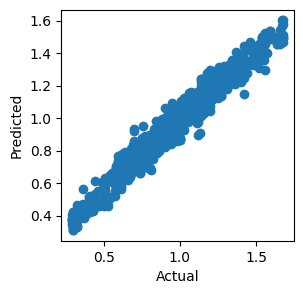

In [12]:
y_pred = model.predict(X)
plt.figure(figsize=(3,3))
plt.scatter(y,y_pred)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.show()

In [13]:
import shap

# Assuming 'model' is your trained regression model and 'X' is your feature matrix
explainer = shap.Explainer(model)
shap_values = explainer.shap_values(X)


In [14]:
features = X.columns.tolist()

In [17]:
X.shape

(1514, 98)

In [16]:
X.head(3)

,DistrictName,year,stl1_11,stl1_12,stl1_1,stl1_2,stl1_3,stl1_4,stl2_11,stl2_12,...,rain_1,rain_2,rain_3,rain_4,countrain_11,countrain_12,countrain_1,countrain_2,countrain_3,countrain_4
0,71,0,22.111803,17.715332,16.327410,20.361004,23.659508,31.437727,22.585130,18.451017,...,0.857311,0.464838,0.844696,0.232295,3.0,2.0,3.0,3.0,5.0,1.0
1,71,1,21.750826,17.179908,16.792149,22.413083,27.930893,34.309400,22.489250,18.004682,...,0.037661,0.008592,0.000000,0.000000,1.0,0.0,0.0,0.0,0.0,0.0
2,71,2,21.487482,18.175713,18.273638,20.352490,26.852755,33.780182,22.314997,18.965504,...,0.000000,0.014953,0.035509,0.008895,1.0,0.0,0.0,0.0,0.0,0.0


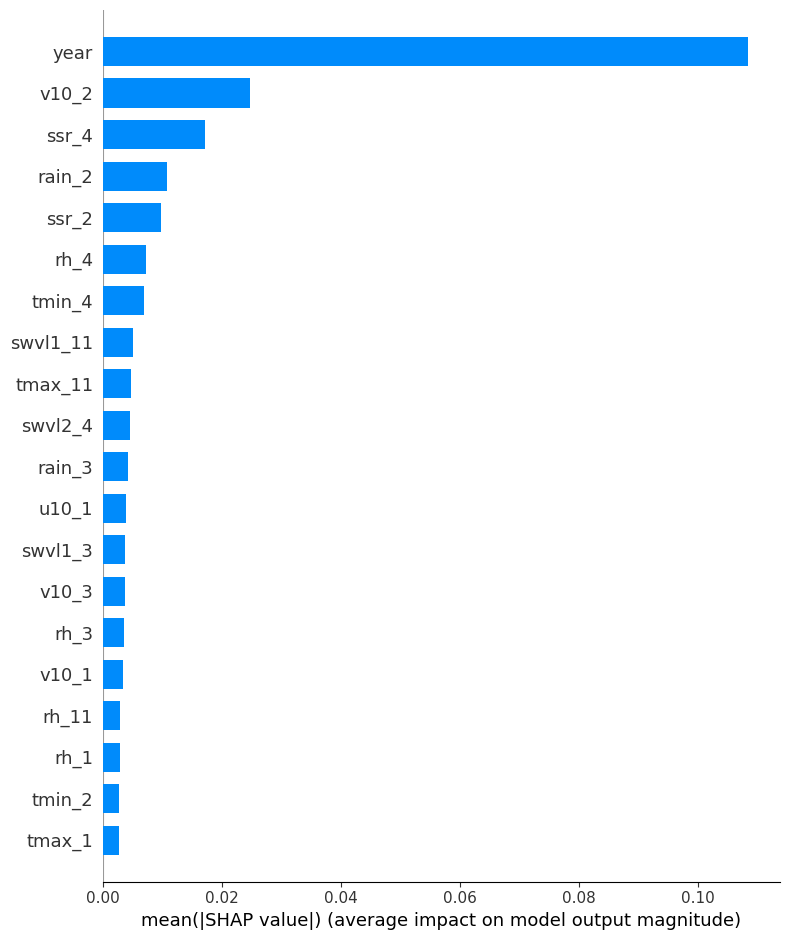

In [18]:
shap.summary_plot(shap_values, X_train, feature_names=features, plot_type="bar")

In [19]:
# for idx in range(50):  # Loop through indexes from 0 to 49
#     shap.dependence_plot(idx, shap_values, X, feature_names=features)

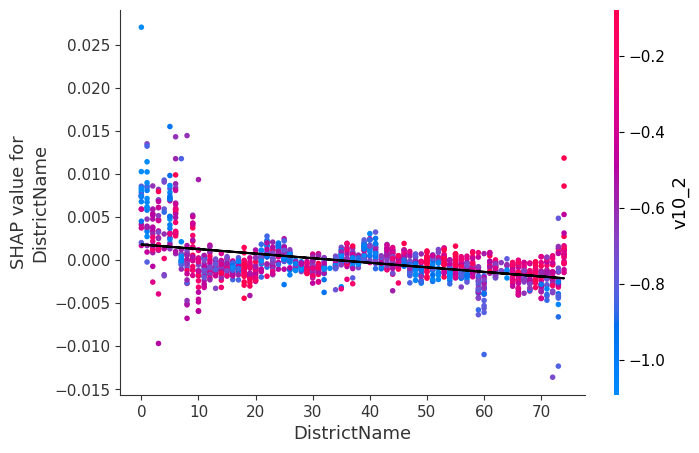

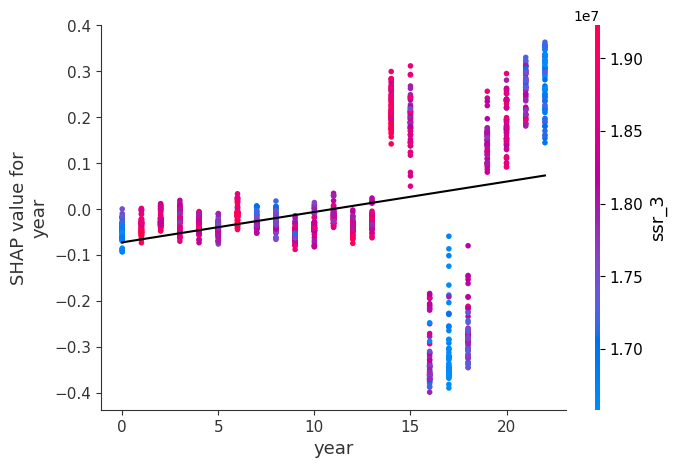

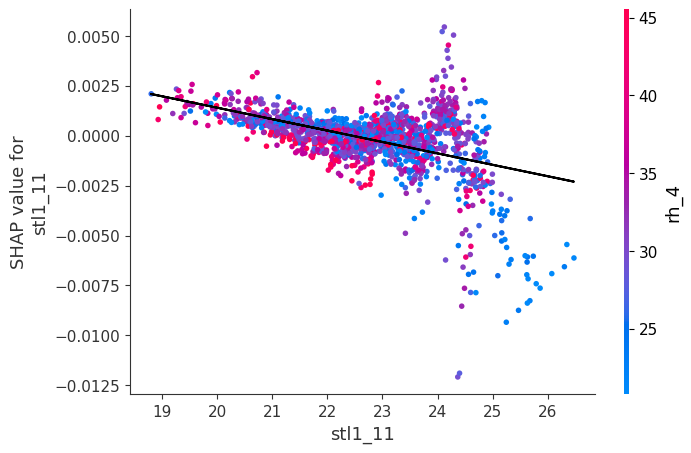

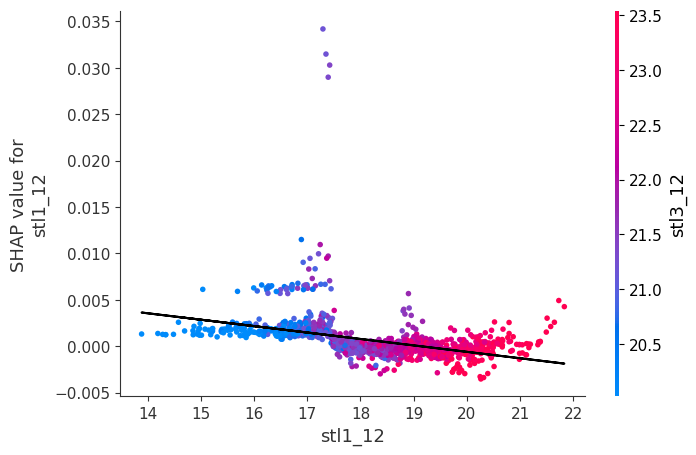

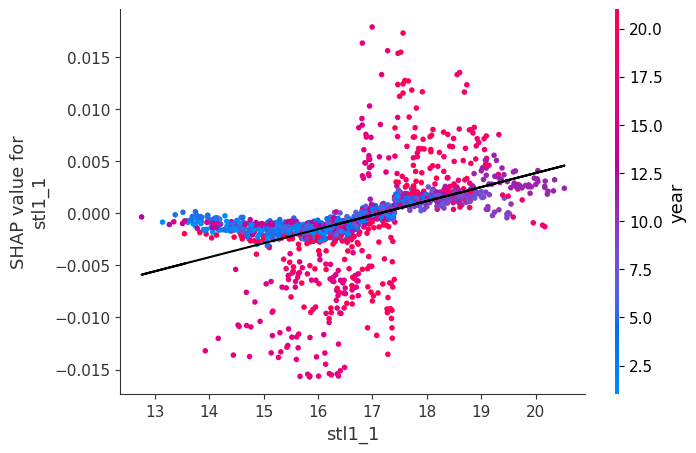

...

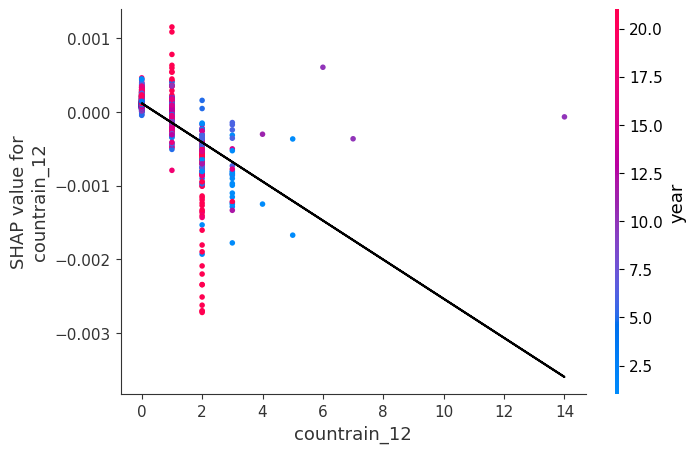

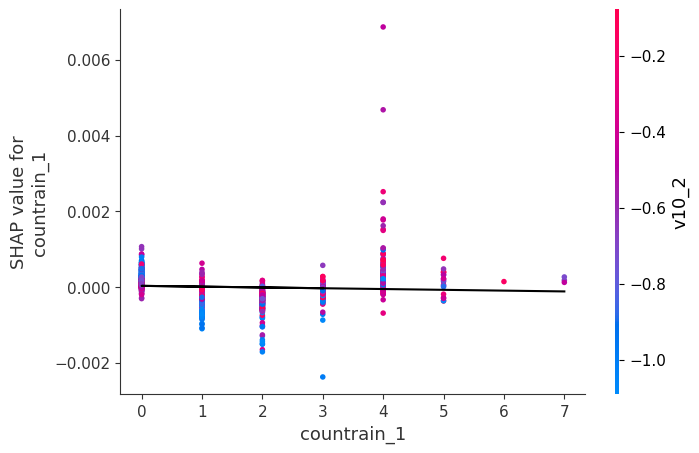

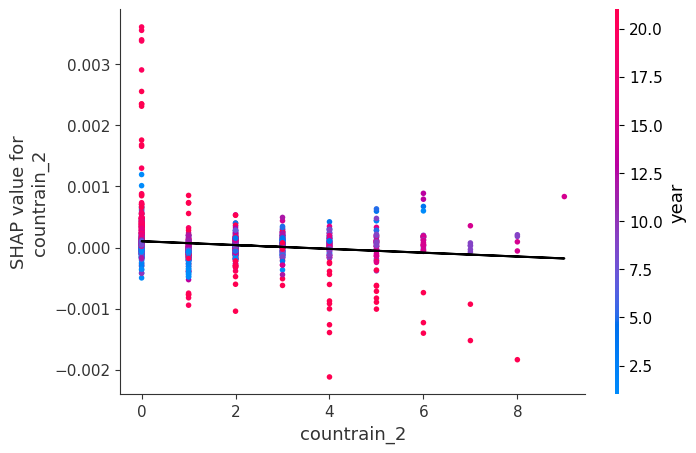

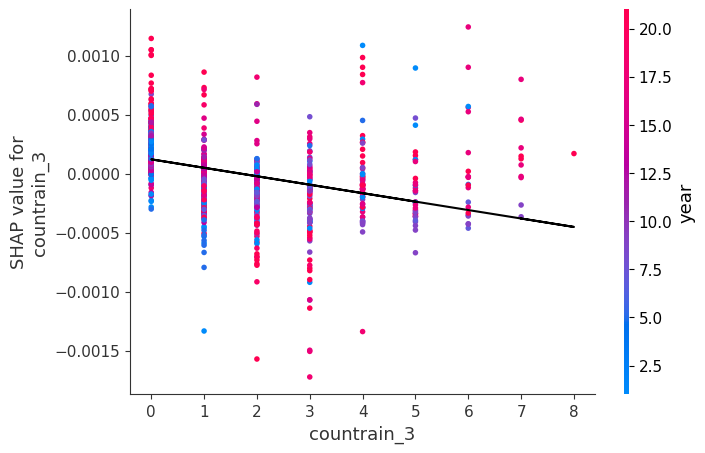

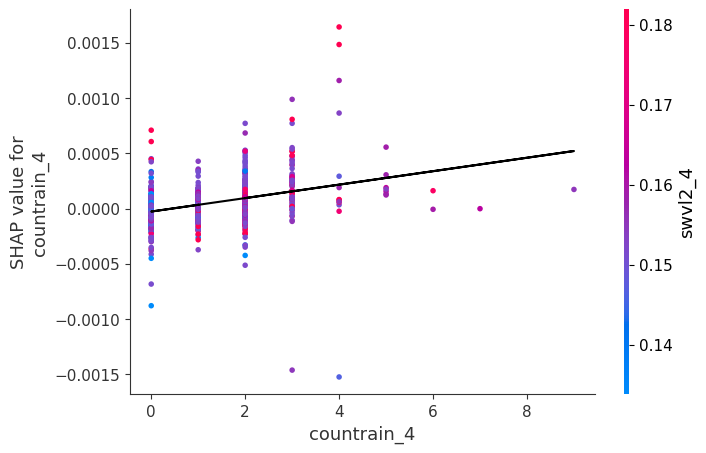

IndexError: index 98 is out of bounds for axis 1 with size 98

In [22]:
import shap
import numpy as np
import matplotlib.pyplot as plt

# Assuming shap_values and X are defined
# features is assumed to be a list containing the names of the features

for idx in range(100):  # Loop through indexes from 0 to 49
    shap.dependence_plot(idx, shap_values, X, feature_names=features, show=False)
    
    # Extract data for current feature
    if isinstance(X, np.ndarray):
        x_values = X[:, idx]
    else:  # Assuming X is a DataFrame
        x_values = X.iloc[:, idx]
    
    y_values = shap_values[:, idx]
    
    # Calculate best fit line
    coef = np.polyfit(x_values, y_values, 1)
    poly1d_fn = np.poly1d(coef)
    
    # Plot best fit line
    plt.plot(x_values, poly1d_fn(x_values), color='black')
    plt.show()


In [20]:
X.columns

Index(['year', 'stl1_1', 'stl1_2', 'stl2_1', 'stl2_2', 'stl3_1', 'stl3_2',
       'stl4_1', 'stl4_2', 'swvl1_1', 'swvl1_2', 'swvl2_1', 'swvl2_2',
       'swvl3_1', 'swvl3_2', 'swvl4_1', 'swvl4_2', 'ssr_1', 'ssr_2',
       'DistrictName', 'rain_1', 'rain_2', 'tmax_1', 'tmax_2', 'tmin_1',
       'tmin_2', 'countrain_1', 'countrain_2', 'u10_3', 'u10_4', 'v10_3',
       'v10_4', 'rh_3', 'rh_4', 'stl1', 'stl2', 'stl3', 'stl4', 'swvl1',
       'swvl2', 'swvl3', 'swvl4', 'ssr', 'rain', 'tmax', 'tmin', 'countrain',
       'u10', 'v10', 'rh'],
      dtype='object')

In [16]:
stop

NameError: name 'stop' is not defined

In [31]:
expected_value = explainer.expected_value

In [32]:
if isinstance(expected_value, list):
    expected_value = expected_value[1]
print(f"Explainer expected value: {expected_value}")

Explainer expected value: [0.66277226]


In [33]:
select = range(50)
features = X.iloc[select]

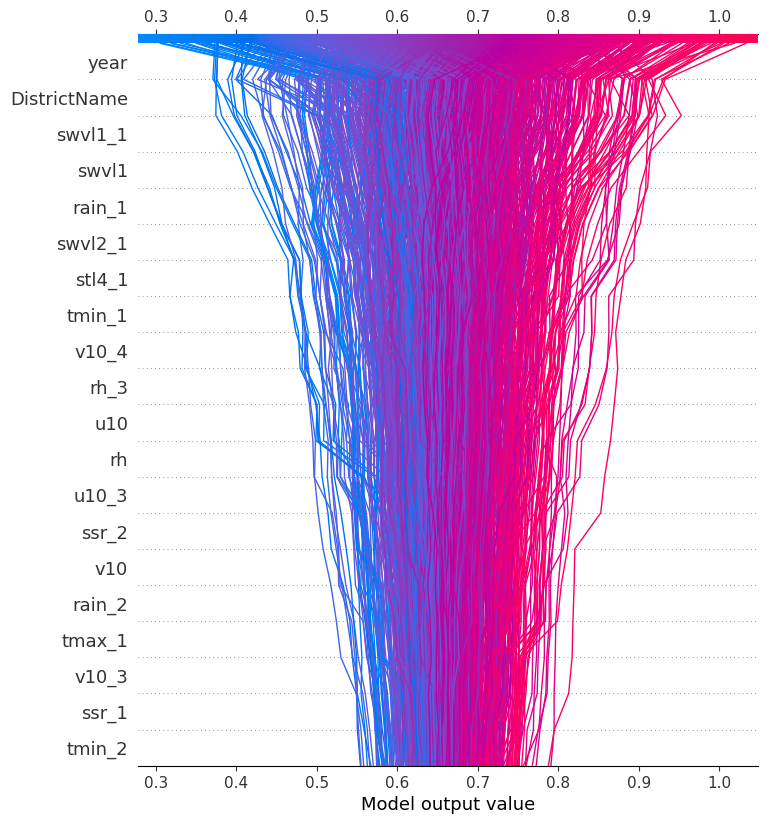

In [34]:
shap.decision_plot(expected_value, shap_values, features)

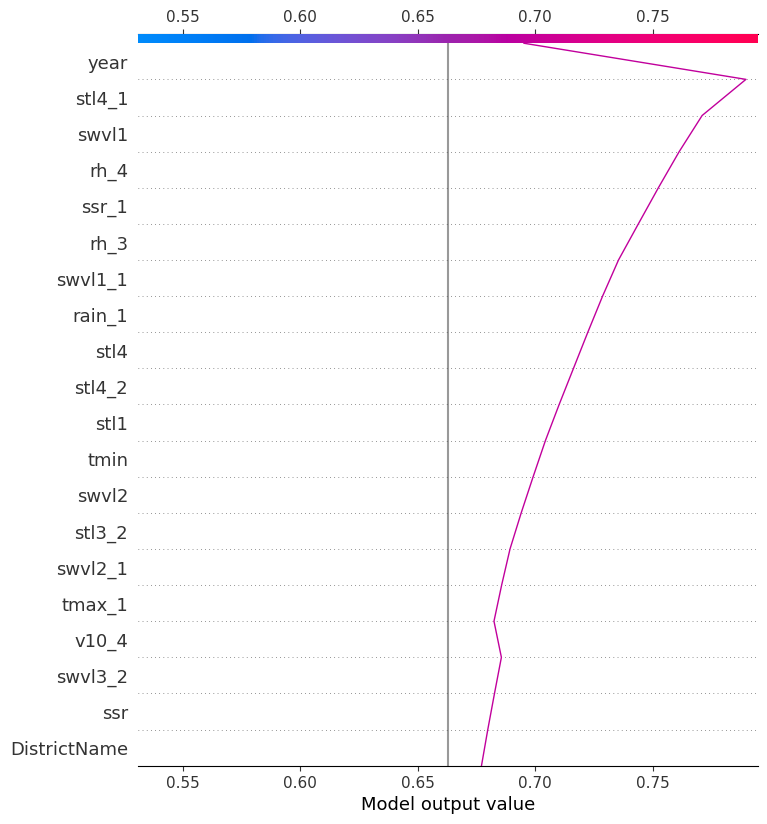

In [35]:
shap.decision_plot(explainer.expected_value[0], shap_values[0], feature_names = list(features))

In [ ]:
from IPython.display import display

In [ ]:
explanation = explainer(X)

In [ ]:
# shap.initjs()
# shap.plots.force(explanation[0:500], plot_cmap="DrDb")

In [ ]:
# visualize the first 5 predictions explanations with a dark red dark blue color map.
shap.force_plot(explainer.expected_value, shap_values[0:1,:], X_test[0:1,:], plot_cmap="DrDb", feature_names=features)

In [ ]:
stop

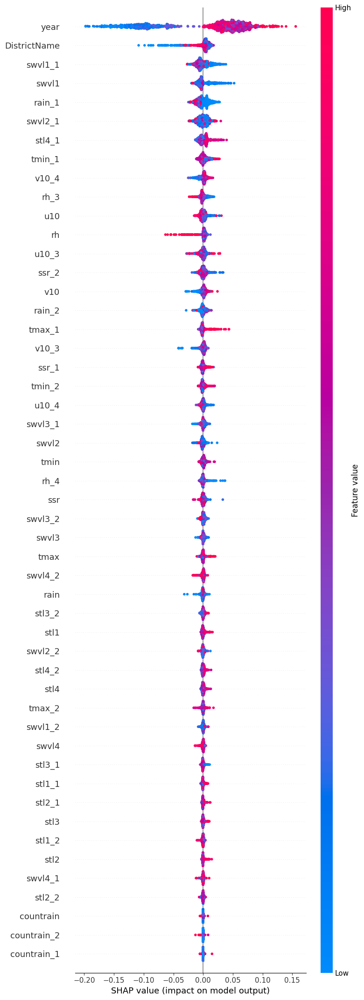

In [36]:
shap.summary_plot(shap_values, X, max_display=50)

In [ ]:
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt
import seaborn as sns


# Set Seaborn style
sns.set_style("whitegrid")

features = list(range(50))
display = PartialDependenceDisplay.from_estimator(model, X, features)

plt.gcf().set_size_inches(100, 500)  # Adjust the size as needed
plt.show()

In [ ]:
explainer = shap.Explainer(model)
shap_values = explainer(X)

In [ ]:
np.shape(shap_values.values)

In [ ]:
# shap.plots.waterfall(shap_values[0])

In [ ]:
# shap.initjs()
# shap.plots.force(shap_values)

In [37]:
shap.plots.bar(shap_values, max_display=50)

TypeError: The shap_values argument must be an Explanation object, Cohorts object, or dictionary of Explanation objects!

not enough data in bin #6 for feature countrain_2, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #7 for feature countrain_2, so it'll be ignored. Try increasing the number of records to plot.


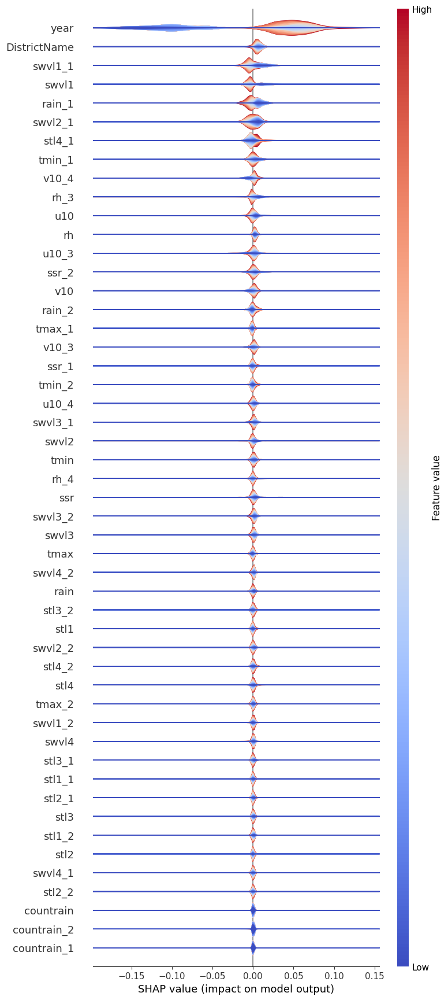

In [38]:
shap.plots.violin(shap_values, features=X,plot_type = 'layered_violin', max_display=50)

In [ ]:
shap.plots.bar(shap_values.cohorts(2).abs.mean(0))

In [ ]:
stop

In [ ]:
a = df['swvl1']
b = df['Yield(Tonnes/Hectare)']
slope, intercept = np.polyfit(a,b, 1)

# Calculate the best-fit line
best_fit_line = slope * a + intercept

# Plot the scatter plot and the best-fit line
plt.scatter(a, b, label='Data points')
plt.plot(a, best_fit_line, color='red', label='Best-fit line')
plt.xlabel('swvl1')
plt.ylabel('Yield(Tonnes/Hectare)')
plt.title('Scatter Plot with Best-fit Line')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# explain all the predictions in the test set
explainer = shap.TreeExplainer(rforest)
shap_values = explainer.shap_values(X)
shap.summary_plot(shap_values, X)

In [ ]:
shap.dependence_plot("rh_3", shap_values, X)

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X)